# This is Colab Notebook

# 🐶 End-to-end Multil-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [2]:
# Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/Ml-Dog_Vision/dog-breed-identification.zip" -d "drive/MyDrive/Ml-Dog_Vision/"

### Get Our WorkSpace ready
* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [3]:
# Import tensorflow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [4]:
# Import the tensor flow hub
import tensorflow_hub as hub
print("TensorflowHub version:", hub.__version__)

# Check for GPU availability
print("GPU", "availabale (Yesssss!!!!)" if tf.config.list_physical_devices("GPU") else "not availabale :(")

TensorflowHub version: 0.16.1
GPU not availabale :(


## Getting our data Ready (turning into Tensors)

With all machine leaning modles, our data has to be in numerical format. So that's what we will be doing first. Turnong our images into Tensors (numerical representataions).

Let's satart by accessing our data and checking out the labels.

In [5]:
# Import the pandas
import pandas as pd

# Checkout thelabels of our data
labels_csv = pd.read_csv("/content/drive/MyDrive/Ml-Dog_Vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

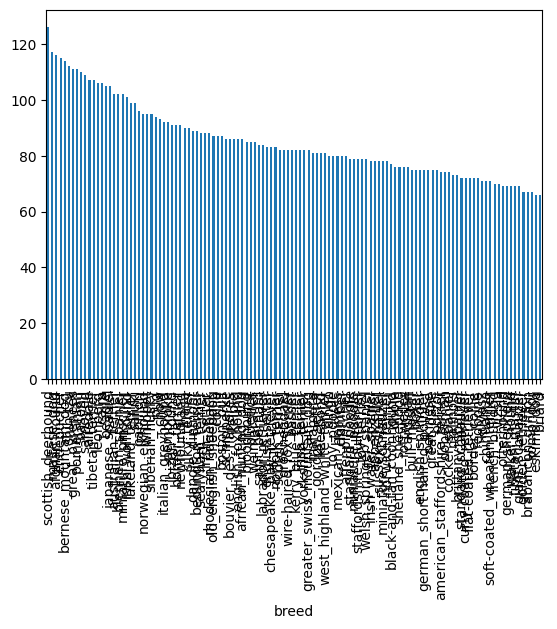

In [7]:
# How many images are there in each breed
labels_csv["breed"].value_counts().plot.bar()

In [8]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [9]:
labels_csv["breed"].value_counts().median()

82.0

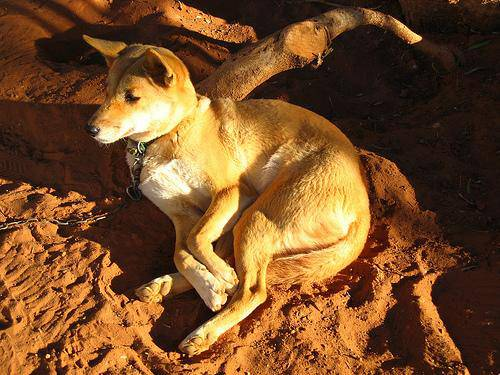

In [10]:
# Let;s view an imgae
from IPython.display import Image
Image("/content/drive/MyDrive/Ml-Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and ttheir labels

Let's get a list of all our image file pathnames.

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
# Let's cerate a pathname from the image ID's
filenames = ["drive/MyDrive/Ml-Dog_Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [13]:
# Check the firet 5
filenames[:5]

['drive/MyDrive/Ml-Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [14]:
# Check whether number of filnames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Ml-Dog_Vision/train/"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed")
else:
  print("Filenames do not match actual amount of files!!!")

Filenames match actual amount of files!!! Proceed


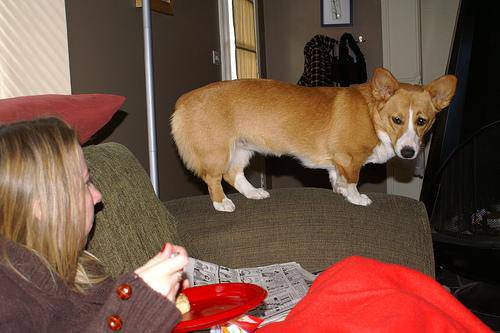

In [15]:
Image(filenames[10000])

In [16]:
labels_csv["breed"][10000]

'pembroke'

Since we've got our training image filepaths in a list, let's prepare our labels

In [17]:
import numpy as np
# labels = labels_csv["breed"].to_numpy
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
len(labels)

10222

In [19]:
# See if no.of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not match the number of filenames, check data directories")

Number of labels matches the number of filenames


In [20]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [21]:
# trun a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
# Turn every label into boolean values
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
len(boolean_labels)

10222

In [24]:
# Example: Turning boolean array into intergers
print(labels[0])
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in the boolean array
print(boolean_labels[0].astype(int))  # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
filenames[:10]

['drive/MyDrive/Ml-Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Ml-Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

# Create the validation set

Since the dataset from Kaggle doesn't come with the validation set, we're going to create our own.

In [27]:
X = filenames
Y = boolean_labels

We're going to startoff expermineting with ~1000 images and increase as needed.

In [28]:
# Set no.of images to use for experimenting
NUM_IMAGES = 1000  #@param{type:"slider", min:1000, max:10000, step:1000}

In [29]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
# Split htem into training and validation of total size NUM_IMAGES
X_train, X_valid, Y_train, Y_valid = train_test_split(X[:NUM_IMAGES],
                                                      Y[:NUM_IMAGES],
                                                      test_size=0.2,
                                                      random_state=42)

In [30]:
# Let's have a geez at  the training data
X_train[:5], Y_train[:5]

(['drive/MyDrive/Ml-Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Ml-Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Ml-Dog_Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Ml-Dog_Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Ml-Dog_Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

## Preperocessing Images  (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take a image filepath as input
2. Use tensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel from 0-255 to 0-1)
5. Resize the `images` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's ee what importing an image looks like.

In [31]:
# Convert inage to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [32]:
image.max(), image.min()

(255, 0)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
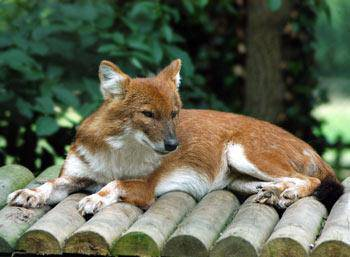

In [33]:
image

In [34]:
# Turn image into Tensor
tf.constant(image);

Let's now make a function to preprocess them

In [35]:
# Define the image size
IMG_SIZE = 224

# Create a function to process images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the umage into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels(Read, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired calue (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

In [36]:
# Check what tf.io.rad_file(), tf.image.decode_jpeg(), tf.image.convert_image_dtype(), tf.image.resize() does with an example
tensor = tf.io.read_file(filenames[26])
tensor = tf.image.decode_jpeg(tensor, channels=3);
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tf.image.resize(tensor, size = [IMG_SIZE, IMG_SIZE]);

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is batch size images at a time (you can manually adjust the batch size id needed))

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
(`image, label`)

In [37]:
# Create  a  simple function to retun a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label, processes the image and retuens a type of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [38]:
# Demo of the above
(process_image(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensores in the form `(image, label)`, let' make a function to turn all of our data (x & y) into batches.

In [39]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, Y=None, batche_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates bathches of our data out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts the test data as input (no labels)
  """
  # If the data is the test dataset, we probably don.t have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),   # Filepaths
                                               tf.constant(Y)))    # Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))

    # Shuffling path names and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [40]:
# create trainign and validation databatches
train_data = create_data_batches(X_train, Y_train)
valid_data = create_data_batches(X_valid, Y_valid, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [41]:
# Check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulaizing the data Batches

Our data is now in bathces, however, these can be a little hard to understand/comprehend, lt's visualize them!

In [42]:
from matplotlib import pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from the data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25  (for displaying 25 imges)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

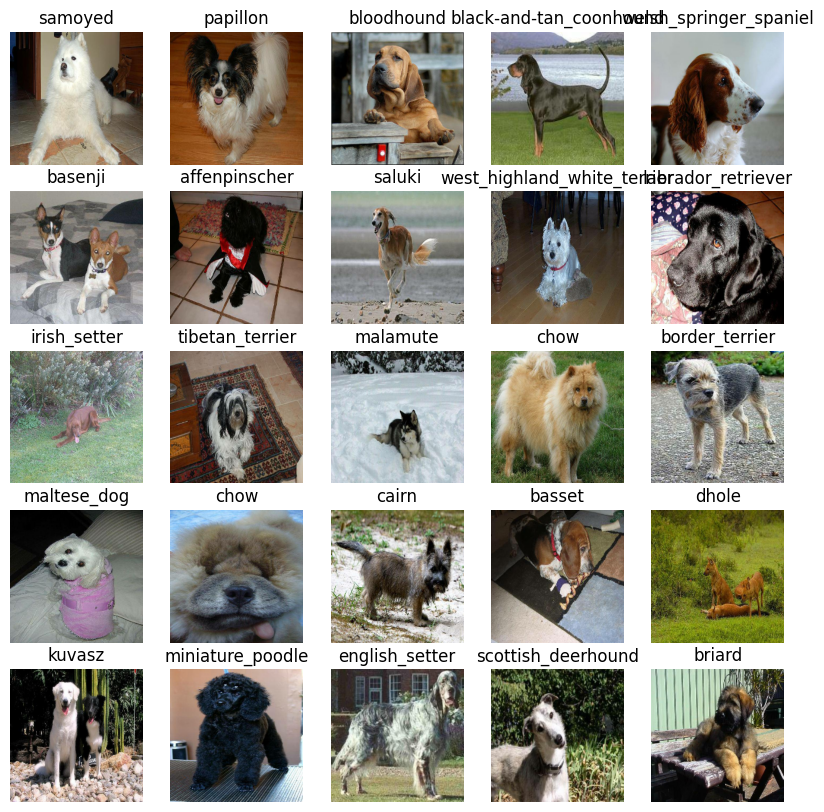

In [43]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# train_images, train_labels
# len(train_images), len(train_labels)

# Now let's visualize the data in training batch
show_25_images(train_images, train_labels)

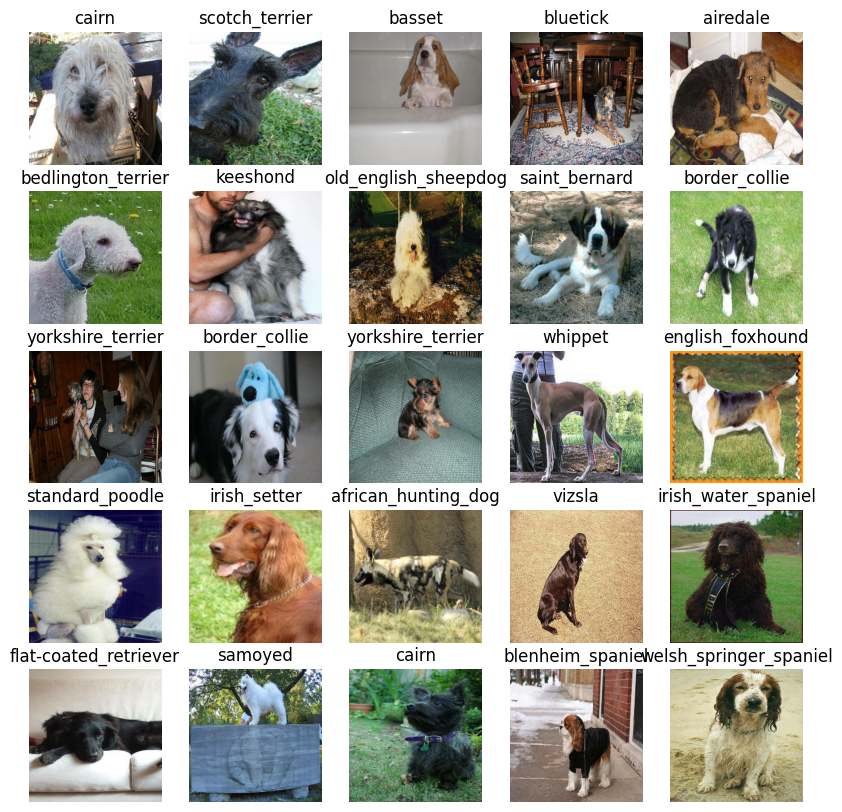

In [44]:
# Now let's visualize the validation set
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

## Building a Model

Before we build a model, there a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [45]:
IMG_SIZE

224

In [46]:
# Steup the input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   # batch, height, width, color chamnnels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)   # shape of the output array

# setup the model URL from the TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a KEras deep leaning model!

Knowing this let's create a function which:

* Takes the input shape, output and the model we've choden as parameter.
* Defines the layers in a KEras model in the sequential model in sequential fashion (do this first, then this, then that).
* Compiles the model (syas how it should be evaluted and improved)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [47]:
# Create a function which buils the Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)
  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer - 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax")  # Layer -2 (Output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Bulid the moodel
  model.build(INPUT_SHAPE)

  return model

In [48]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Create callbacks

Callbacks are helper functions a modle can use during the training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [49]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [50]:
import datetime

# Create a function to build a tensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Ml-Dog_Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment)
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [51]:
# Create esrly stopping csllback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [52]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [53]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [54]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a anew TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # return the fitted model
  return model

In [85]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 77s 3s/step - loss: 4.4166 - accuracy: 0.1125 - val_loss: 3.4260 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 65s 3s/step - loss: 1.5414 - accuracy: 0.7375 - val_loss: 2.2136 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 63s 3s/step - loss: 0.5226 - accuracy: 0.9550 - val_loss: 1.7126 - val_accuracy: 0.6450
Epoch 4/100
25/25 [==============================] - 63s 3s/step - loss: 0.2350 - accuracy: 0.9900 - val_loss: 1.5491 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 67s 3s/step - loss: 0.1384 - accuracy: 0.9975 - val_loss: 1.4816 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 58s 2s/step - loss: 0.0957 - accuracy: 1.0000 - val_loss: 1.4316 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================] - 58s 2s/s

**Question**: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize its contents.

In [86]:
%tensorboard --logdir /content/drive/MyDrive/Ml-Dog_Vision/logs/20240620-062150

Reusing TensorBoard on port 6006 (pid 11241), started 0:19:06 ago. (Use '!kill 11241' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [87]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [88]:
# Make th epredictions on the validation data (not used to train the model)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 27s 1s/step


array([[4.59691510e-03, 1.38398493e-04, 1.35375257e-03, ...,
        4.64066776e-04, 8.18138142e-05, 4.95496951e-03],
       [3.42295767e-04, 2.96302780e-04, 6.75050868e-03, ...,
        1.86134290e-04, 7.89145939e-04, 1.82187607e-04],
       [8.96861275e-06, 1.65463716e-04, 2.99422536e-05, ...,
        3.48117537e-05, 3.84569576e-05, 8.73012934e-04],
       ...,
       [1.77531638e-06, 1.58396815e-05, 1.78774899e-05, ...,
        3.73438570e-06, 5.96281316e-05, 6.71220278e-06],
       [1.89537555e-02, 3.31036816e-03, 1.24322090e-04, ...,
        2.82742403e-04, 5.44379982e-05, 1.23778321e-02],
       [8.72558740e-04, 1.08213986e-04, 5.25473058e-03, ...,
        1.57408509e-02, 6.62548514e-03, 1.67032176e-05]], dtype=float32)

In [89]:
predictions.shape

(200, 120)

In [90]:
len(predictions[0])

120

In [91]:
len(Y_valid)

200

In [92]:
len(unique_breeds)

120

In [93]:
predictions[0].shape

(120,)

In [94]:
np.sum(predictions[0])

1.0

In [95]:
ind = predictions[0].argmax()

In [96]:
unique_breeds[ind]

'cairn'

In [97]:
# First predictios
index = 1
print(predictions[index])
print(f"Max value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")
print(f"Original label: {unique_breeds[np.argmax(Y_valid[index])]}")

[3.42295767e-04 2.96302780e-04 6.75050868e-03 1.76314745e-04
 4.23103716e-04 1.70589428e-05 8.78735725e-03 2.27273587e-04
 5.81243308e-04 5.23106020e-04 9.13781521e-04 2.75537368e-05
 1.64669022e-04 8.04940282e-06 4.99801426e-05 1.02618134e-04
 5.18161245e-03 8.85812333e-04 4.41502285e-04 1.82822027e-04
 8.36908119e-04 7.53494605e-05 6.15312310e-05 4.92586551e-05
 2.63371068e-04 1.31590248e-04 6.73619062e-02 2.28814757e-03
 1.24479906e-04 3.08402610e-04 3.63503350e-05 3.01494993e-06
 4.55127563e-04 6.02559448e-05 1.14514296e-04 1.70328363e-04
 1.19891549e-04 1.84435595e-03 1.55782127e-05 1.05199078e-05
 2.02222684e-04 2.95765087e-04 1.28568805e-04 2.57748237e-04
 1.33231143e-03 2.67156283e-03 4.48164181e-04 1.07386593e-04
 6.05043359e-02 2.01096664e-05 3.15881625e-05 1.92618769e-04
 5.06757460e-05 1.25370454e-04 2.60299217e-04 2.36012507e-03
 1.31410910e-04 3.78572079e-03 2.66710646e-04 6.49274909e-04
 3.86477477e-04 3.48873164e-06 2.84031285e-05 3.93328810e-05
 2.63596210e-03 6.556599

Having the above functionality is great but want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note**: Prediction probabilities are also known as confidence interval

In [98]:
# Turn prediction probabilities into their respective labels (easir to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [99]:
# Get a predicted label based on an array of prediction probabilities
predicted_label = get_pred_label(predictions[34])
predicted_label

'malamute'

In [100]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [101]:
images_ = []
labels_ =[]

# Lopp through the unbatched data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

# images_[0], labels_[0]

In [102]:
# Create a function using the above codes to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [103]:
# Unbatchifying the validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [104]:
get_pred_label(valid_labels[0])

'affenpinscher'

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [105]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image ans remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title dependong on if the predictions is right or wrong
  if pred_label == true_label:
    color ="green"
  else:
    color = "red"


  # Chage plot title to be Predicted, probability of prediction and truth label
  plt.title("Pedicted: {} {:2.0f}% True:{}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)



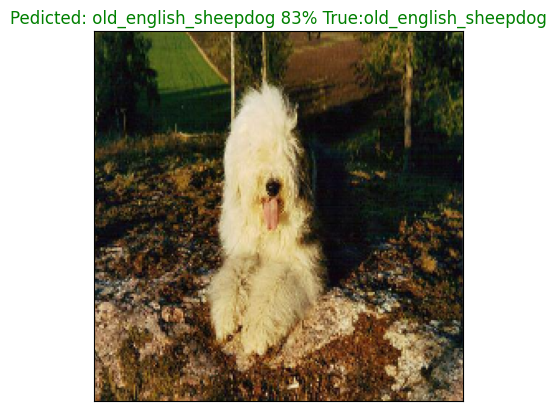

In [106]:
plot_pred(prediction_probabilities=predictions,
          labels= valid_labels,
          images=valid_images,
          n=7)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [107]:
predictions[0]

array([4.59691510e-03, 1.38398493e-04, 1.35375257e-03, 1.67073114e-04,
       1.33979006e-03, 1.59518167e-05, 2.22287253e-02, 1.86141784e-04,
       2.94586614e-04, 5.49271749e-03, 2.00692425e-03, 1.47737504e-04,
       1.06060485e-04, 1.04437881e-04, 1.80999190e-03, 3.44420463e-04,
       9.00247251e-05, 1.10286459e-01, 9.80052482e-06, 7.69647158e-05,
       1.54403585e-03, 2.98076302e-05, 1.94567947e-05, 2.04825797e-03,
       5.07692785e-05, 1.35464812e-04, 2.55885541e-01, 2.61162553e-04,
       1.56149836e-04, 1.14277669e-03, 2.05788805e-04, 7.74746528e-04,
       1.69784832e-03, 1.77929924e-05, 5.11248130e-04, 3.19422372e-02,
       3.62609935e-05, 1.82507341e-04, 6.39403661e-05, 7.26706639e-05,
       9.69093293e-04, 2.13923238e-04, 2.30272490e-05, 3.37301499e-05,
       3.44326654e-05, 6.29788483e-05, 1.37583174e-05, 6.63777973e-05,
       1.48246865e-04, 5.41847839e-04, 1.59883693e-05, 1.50009728e-05,
       1.48289721e-04, 1.41417084e-04, 2.29729281e-04, 1.50861488e-05,
      

In [108]:
# Returns the indexes of the sorted elements in the list
predictions[0].argsort()[-10:][::-1]   # Top 10 pred indexes of predictions 0

array([ 26,  59,  17, 103,  73, 109,  35, 100,  65, 106])

In [109]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.25588554, 0.1498469 , 0.11028646, 0.05248808, 0.04672318,
       0.04156885, 0.03194224, 0.03043599, 0.03037148, 0.02681387],
      dtype=float32)

In [110]:
predictions[0].max()

0.25588554

In [111]:
# Top 10 labels the model predicted
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'irish_wolfhound', 'border_terrier',
       'soft-coated_wheaten_terrier', 'maltese_dog', 'tibetan_terrier',
       'dandie_dinmont', 'shih-tzu', 'komondor', 'standard_schnauzer'],
      dtype=object)

In [112]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the prediction_label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # FInd the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set up the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

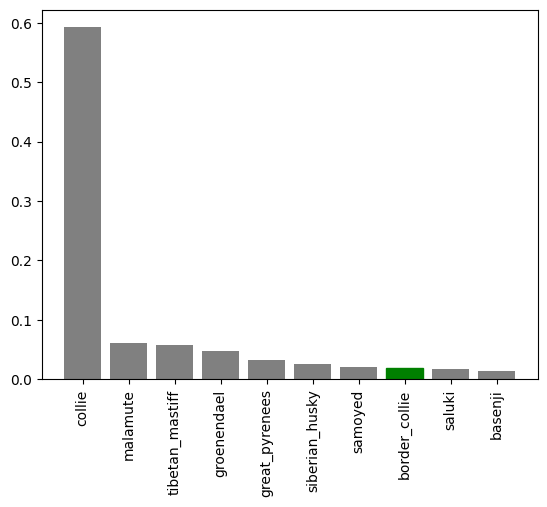

In [118]:
plot_pred_conf(prediction_probabilities = predictions,
               labels=valid_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

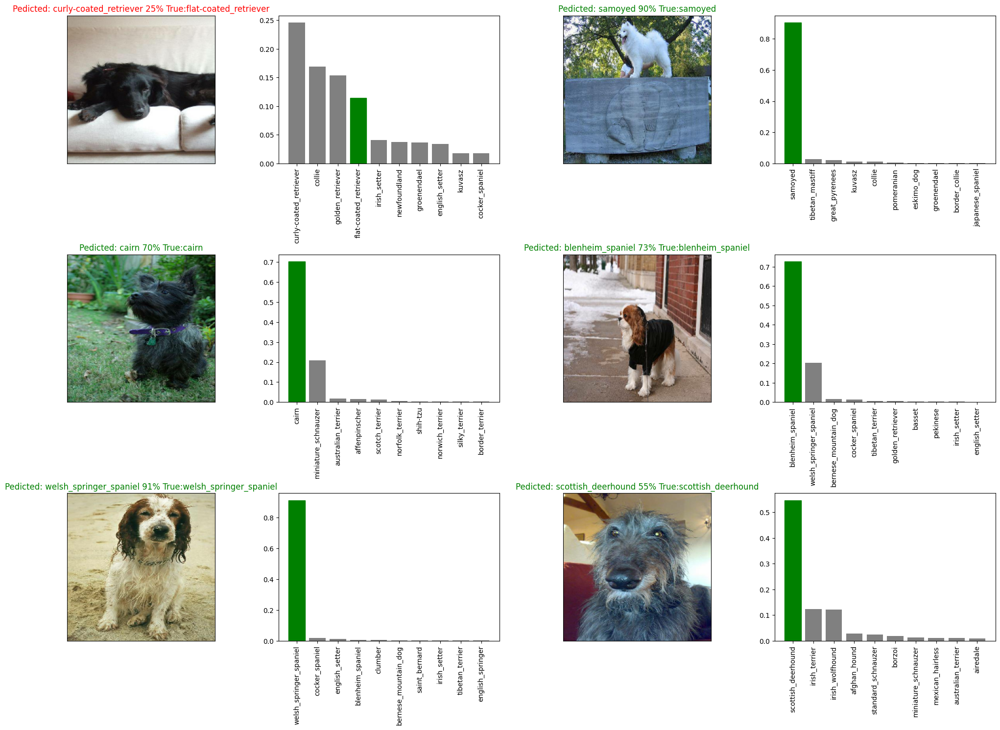

In [119]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i  in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = valid_labels,
            images = valid_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=valid_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()